In [1]:
# Step 1: Set up Kaggle API for dataset download
!git clone https://github.com/niaz1971/BRAIN_TUMOR_DETECTION_USING_DEEP_LEARNING.git

Cloning into 'BRAIN_TUMOR_DETECTION_USING_DEEP_LEARNING'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (325/325), done.
remote: Compressing objects: 100% (319/319), done.
remote: Total 325 (delta 25), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (325/325), 18.76 MiB | 4.34 MiB/s, done.
Resolving deltas: 100% (25/25), done.


In [2]:
cd BRAIN_TUMOR_DETECTION_USING_DEEP_LEARNING

/content/BRAIN_TUMOR_DETECTION_USING_DEEP_LEARNING


In [3]:
!pip install lime kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset
!unzip -q brain-tumor-mri-dataset.zip
!rm brain-tumor-mri-dataset.zip
!mkdir brain-tumor-mri-dataset
!mv Training brain-tumor-mri-dataset/
!mv Testing brain-tumor-mri-dataset/
!rm kaggle.json

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=9accd787d4d2f11f47177f25924a6dfc5a8c4a679a0d0bc21808d84cea2e4343
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime
Dataset URL: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset
License(s): CC0-1.0
 94% 140M/149M [00:00<00:00, 1.47GB/s]
100% 149M/149M [00:00<00:00, 1.45GB/s]


In [4]:
# === General Imports ===
import os
import random
import warnings
import numpy as np
import pandas as pd
import tensorflow as tf
import kagglehub
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import VGG19
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
# === Visualization Libraries ===
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# === Ignore Warnings ===
warnings.filterwarnings("ignore")

# === Keras Model Utilities ===
from keras.utils import plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras import models
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
)
from tensorflow.keras.optimizers import legacy


# === Callbacks for Training ===
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
)

# === Evaluation Metrics ===
from sklearn.metrics import (
    confusion_matrix, classification_report, ConfusionMatrixDisplay
)

# === Image Data Preprocessing ===
from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator, load_img, img_to_array, array_to_img
)

## Import and preview the dataset

In [5]:
# === Extract class labels from Training folder ===

# Path to the dataset root (from Kaggle download)
filename = 'brain-tumor-mri-dataset'

# Get all sub-folder names in the Training folder
classes = []
train_path = os.path.join(filename, 'Training')

for sub_folder in os.listdir(train_path):
    if os.path.isdir(os.path.join(train_path, sub_folder)):
        classes.append(sub_folder)

# Print detected class names
print("Detected Classes:", classes)


Detected Classes: ['meningioma', 'pituitary', 'glioma', 'notumor']


In [6]:
train_path='brain-tumor-mri-dataset/Training/'
test_path='brain-tumor-mri-dataset/Testing/'

In [7]:
img_list = []
label_list = []

for label in classes:
    label_folder = os.path.join(train_path, label)
    for img_file in os.listdir(label_folder):
        img_path = os.path.join(label_folder, img_file)
        img_list.append(img_path)
        label_list.append(label)

print(f"Total images: {len(img_list)}")
print(f"Sample image path: {img_list[0]}")
print(f"Sample label: {label_list[0]}")


Total images: 5712
Sample image path: brain-tumor-mri-dataset/Training/meningioma/Tr-me_0518.jpg
Sample label: meningioma


In [8]:
train_data = pd.DataFrame({'Image':img_list,'Label':label_list})
train_data

,Image,Label
0,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
1,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
2,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
3,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
4,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
...,...,...
5707,brain-tumor-mri-dataset/Training/notumor/Tr-no...,notumor
5708,brain-tumor-mri-dataset/Training/notumor/Tr-no...,notumor
5709,brain-tumor-mri-dataset/Training/notumor/Tr-no...,notumor
5710,brain-tumor-mri-dataset/Training/notumor/Tr-no...,notumor


In [9]:
print(train_data.shape)
print(train_data['Label'].value_counts())
train_data.head()


(5712, 2)
Label
notumor       1595
pituitary     1457
meningioma    1339
glioma        1321
Name: count, dtype: int64


,Image,Label
0,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
1,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
2,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
3,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma
4,brain-tumor-mri-dataset/Training/meningioma/Tr...,meningioma


In [10]:
img_list = []
label_list = []

for label in classes:
    label_folder = os.path.join(test_path, label)
    for img_file in os.listdir(label_folder):
        img_path = os.path.join(label_folder, img_file)
        img_list.append(img_path)
        label_list.append(label)

print(f" Total test images: {len(img_list)}")
print(f" First test image path: {img_list[0]}")
print(f" First test label: {label_list[0]}")


 Total test images: 1311
 First test image path: brain-tumor-mri-dataset/Testing/meningioma/Te-me_0145.jpg
 First test label: meningioma


In [11]:
test_data = pd.DataFrame({'Image':img_list,'Label':label_list})
test_data

,Image,Label
0,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
1,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
2,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
3,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
4,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
...,...,...
1306,brain-tumor-mri-dataset/Testing/notumor/Te-no_...,notumor
1307,brain-tumor-mri-dataset/Testing/notumor/Te-no_...,notumor
1308,brain-tumor-mri-dataset/Testing/notumor/Te-no_...,notumor
1309,brain-tumor-mri-dataset/Testing/notumor/Te-no_...,notumor


In [12]:
print(test_data.shape)               # Show rows & columns
print(test_data['Label'].value_counts())  # Class distribution
test_data.head()                    # Preview first few rows


(1311, 2)
Label
notumor       405
meningioma    306
pituitary     300
glioma        300
Name: count, dtype: int64


,Image,Label
0,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
1,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
2,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
3,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma
4,brain-tumor-mri-dataset/Testing/meningioma/Te-...,meningioma


## Data Exploration or Data Visualization

In [13]:
def Plot_Classes(BASE_URL, Rows=2, Columns=5):

    plt.figure(figsize=(Columns * 4, Rows * 4))
    image_count = 1

    for directory in sorted(os.listdir(BASE_URL)):
        dir_path = os.path.join(BASE_URL, directory)
        if os.path.isdir(dir_path) and directory[0] != '.':
            images = os.listdir(dir_path)
            if images:
                random_file = np.random.choice(images)
                img_path = os.path.join(dir_path, random_file)

                plt.subplot(Rows, Columns, image_count)
                image = plt.imread(img_path)
                plt.imshow(image)
                plt.title(directory)
                plt.axis('off')

                image_count += 1
                if image_count > Rows * Columns:
                    break

    plt.tight_layout()
    plt.show()


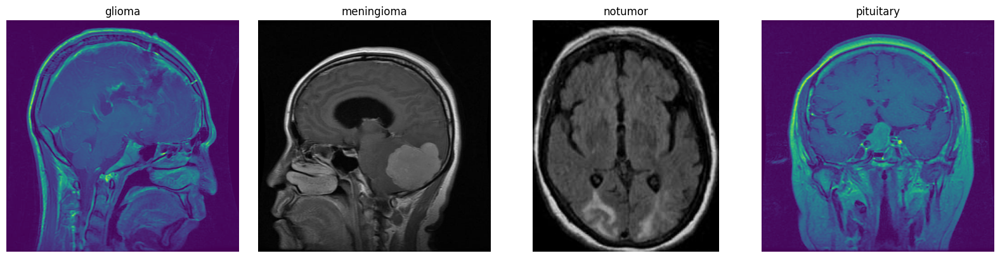

In [14]:
Plot_Classes(train_path)

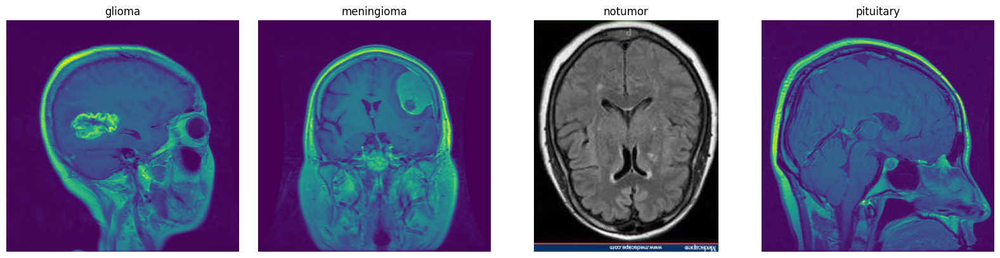

In [15]:
Plot_Classes(test_path)

In [16]:
train_data['Label'].value_counts()

,count
Label,
notumor,1595
pituitary,1457
meningioma,1339
glioma,1321


In [17]:
px.histogram(train_data, y="Label", color="Label", title="Classes Distribution")

In [18]:
test_data['Label'].value_counts()

,count
Label,
notumor,405
meningioma,306
pituitary,300
glioma,300


In [19]:
px.histogram(test_data, y="Label", color="Label", title="Classes Distribution")

## Data Preprocessing

In [20]:
# Define input image dimensions (width, height)
image_size = (150, 150)  # Can also use (224, 224) for pretrained models like VGG, ResNet

# Set the batch size for training
batch_size = 32  # Common values: 16, 32, 64 depending on memory/GPU


In [21]:
# ----------------------------
# Data Augmentation for Training
# ----------------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.15,         # 15% for validation from training set
    rotation_range=10,             # Random rotation in range [-10, 10]
    brightness_range=(0.85, 1.15), # Random brightness adjustment
    width_shift_range=0.002,       # Slight horizontal shift
    height_shift_range=0.002,      # Slight vertical shift
    shear_range=12.5,              # Shearing for distortion
    zoom_range=0.0,                # No zoom
    horizontal_flip=True,          # Flip horizontally
    vertical_flip=False,           # Don't flip vertically (not suitable for most medical/natural images)
    fill_mode="nearest"            # Fill in missing pixels
)

# ----------------------------
# Preprocessing for Validation (No Augmentation)
# ----------------------------
val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.15
)

# ----------------------------
# Training Data Generator
# ----------------------------
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    seed=0
)

# ----------------------------
# Validation Data Generator
# ----------------------------
val_generator = val_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    seed=0
)

# ----------------------------
# Test Data Generator (Only Rescale)
# ----------------------------
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False,
    seed=0
)


Found 4857 images belonging to 4 classes.
Found 855 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


In [22]:
def show_ImageDataGenerator(ImageDataGenerator, num_samples=5, figsize=(12, 12), save=False):
    """
    Function to viusalize how the ImageDataGenerator augments the data
    """

    # Generate augmented samples
    # Use __next__() instead of next()
    augmented_samples = train_generator.__next__()

    # Extract images from the batch
    images = augmented_samples[0][:num_samples]
    # Display the augmented images
    fig, axes = plt.subplots(1, num_samples, figsize=figsize)

    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.axis('off')

    plt.tight_layout()

    if save:
        plt.savefig('show_ImageDataGenerator.pdf')

    plt.show()


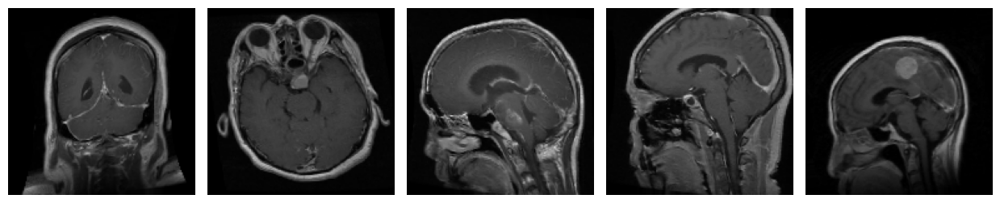

In [23]:
show_ImageDataGenerator(train_generator, num_samples=5, figsize=(12.5, 8), save=False)

### Training Setup

In [24]:
# Define full image shape (height, width, channels)
image_shape = (image_size[0], image_size[1], 3)

# Summary
print("Dataset Summary")
print(f"Image shape              : {image_shape}")
print(f"Batch size               : {batch_size}")
print(f"Number of training batches   : {len(train_generator)}")
print(f"Number of validation batches : {len(val_generator)}")
print(f"Number of testing batches    : {len(test_generator)}")

Dataset Summary
Image shape              : (150, 150, 3)
Batch size               : 32
Number of training batches   : 152
Number of validation batches : 27
Number of testing batches    : 41


In [25]:
# Get class-to-index mapping from training generator
Classes_Map = train_generator.class_indices

# Total number of classes
num_classes = len(Classes_Map)

# Display results
print(f"Number of Classes: {num_classes}")
print("Class Index Mapping:")
for class_name, index in Classes_Map.items():
    print(f"  {index} → {class_name}")

Number of Classes: 4
Class Index Mapping:
  0 → glioma
  1 → meningioma
  2 → notumor
  3 → pituitary


In [26]:
def plot_curves(history):

    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    accuracy = history.history["accuracy"]
    val_accuracy = history.history["val_accuracy"]
    epochs = range(len(loss))

    plt.figure(figsize=(15, 5))
    plt.style.use('ggplot')

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'o-', color='#1f77b4', label="Train Loss")        # Blue
    plt.plot(epochs, val_loss, 'o-', color='#d62728', label="Val Loss")      # Red
    plt.title("Training vs Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, 'o-', color='#2ca02c', label="Train Accuracy")  # Green
    plt.plot(epochs, val_accuracy, 'o-', color='#9467bd', label="Val Accuracy")# Purple
    plt.title("Training vs Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.style.use('default')
    plt.show()


In [27]:
def CM(model, test_generator, categories):

    from sklearn.metrics import confusion_matrix
    # Predictions on test dataset
    predictions = model.predict(test_generator)
    predicted_categories = np.argmax(predictions, axis=1)
    true_categories = test_generator.classes

    # Create a confusion matrix
    confusion_matrix_array = confusion_matrix(true_categories, predicted_categories)
    print(f"Classification Report for {model}:")
    print(classification_report(true_categories, predicted_categories, target_names=categories))

    return confusion_matrix_array


def calculate_metrics(confusion_matrix, categories):

    # Calculating 4 different metrics
    precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=0)
    recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=1)
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = np.sum(np.diag(confusion_matrix)) / np.sum(confusion_matrix)

    # Printing the results based on each category
    for i, category in enumerate(categories):
        print(f"\n ***********************************")
        print(f"Class: {category.title()}")
        print(f"Precision: {precision[i]:.3f}")
        print(f"Recall: {recall[i]:.3f}")
        print(f"F1-Score: {f1_score[i]:.3f}\n")

    # Showing the total accuracy of the model
    print(f"\nAccuracy: {accuracy:.3f}")

#VGG16 Model

In [28]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load the VGG16 base model with pretrained ImageNet weights, exclude the top fully connected layers
base_model_vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze all layers except last 10 layers
for layer in base_model_vgg16.layers[:-10]:
    layer.trainable = False

for layer in base_model_vgg16.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_vgg16.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model assembly
model_vgg16 = Model(inputs=base_model_vgg16.input, outputs=output)

# Compile the model
model_vgg16.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print summary
model_vgg16.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,044 (56.64 MB)

 Trainable params: 13,701,636 (52.27 MB)

 Non-trainable params: 1,145,408 (4.37 MB)

In [29]:
vgg16_history = model_vgg16.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)
model_vgg16.save('vgg16_brain_tumor_model.h5')

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 83s 437ms/step - accuracy: 0.6718 - loss: 0.7772 - val_accuracy: 0.8433 - val_loss: 0.4404
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 46s 301ms/step - accuracy: 0.9069 - loss: 0.2649 - val_accuracy: 0.8187 - val_loss: 0.5285


In [30]:
from tensorflow.keras.models import load_model

# Load the saved model
loaded_model = load_model('vgg16_brain_tumor_model.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


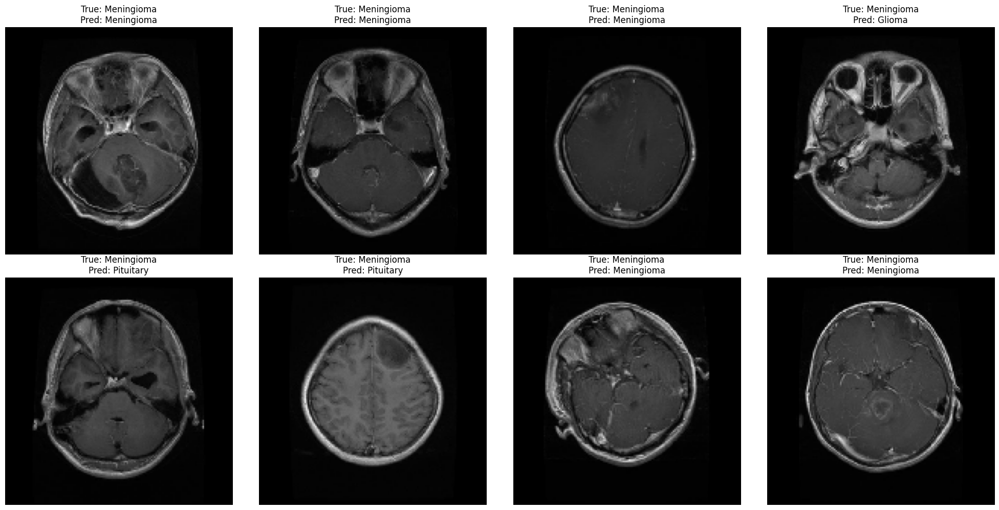

In [31]:
test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

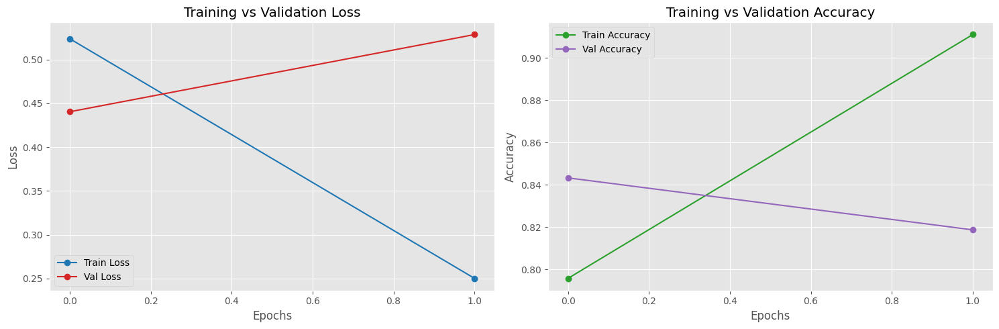

In [32]:
plot_curves(vgg16_history)

In [33]:
loss, accuracy = model_vgg16.evaluate(test_generator)
print(f" Test Loss     : {loss:.5f}")
print(f" Test Accuracy : {accuracy:.5f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 13s 307ms/step - accuracy: 0.8022 - loss: 0.6248
 Test Loss     : 0.52114
 Test Accuracy : 0.84897


In [34]:
# Plotting confusion matrix
confusion_matrix = CM(model=model_vgg16, test_generator=test_generator, categories=classes)

41/41 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step
Classification Report for <Functional name=functional, built=True>:
              precision    recall  f1-score   support

  meningioma       0.96      0.75      0.84       300
   pituitary       0.77      0.77      0.77       306
      glioma       0.79      0.98      0.87       405
     notumor       0.96      0.85      0.90       300

    accuracy                           0.85      1311
   macro avg       0.87      0.84      0.85      1311
weighted avg       0.86      0.85      0.85      1311



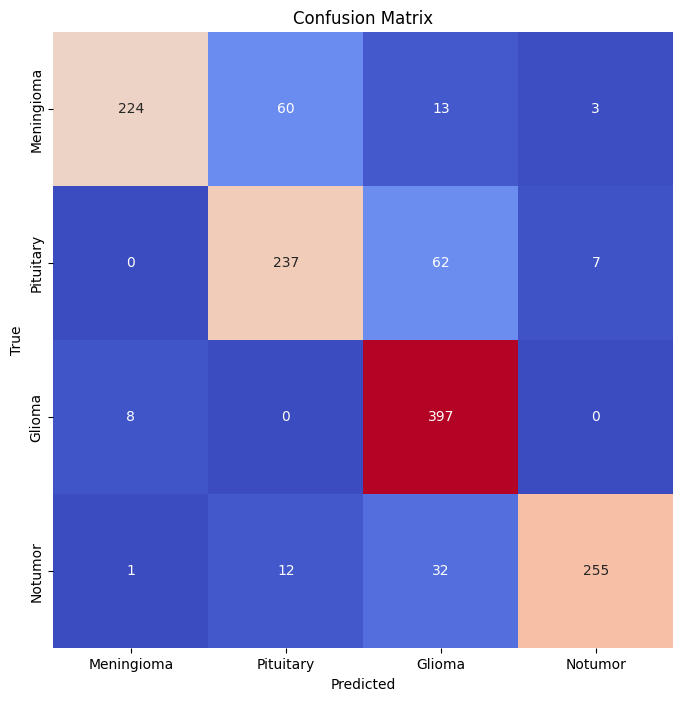

In [35]:
plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()

## VGG19 Model

In [37]:
# Load VGG19 base model with pretrained ImageNet weights
base_model_vgg = VGG19(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze earlier layers for transfer learning (you can fine-tune later)
for layer in base_model_vgg.layers[:-10]:
    layer.trainable = False

for layer in base_model_vgg.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_vgg.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model
model_vgg19 = Model(inputs=base_model_vgg.input, outputs=output)

# Compile the model
model_vgg19.compile(optimizer=Adam(learning_rate=1e-4),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

# Print summary
model_vgg19.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,289,092 (77.40 MB)

 Trainable params: 17,963,524 (68.53 MB)

 Non-trainable params: 2,325,568 (8.87 MB)

In [38]:
vgg19_history = model_vgg19.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 69s 401ms/step - accuracy: 0.6313 - loss: 0.8538 - val_accuracy: 0.8398 - val_loss: 0.4670
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 49s 321ms/step - accuracy: 0.8927 - loss: 0.2931 - val_accuracy: 0.8608 - val_loss: 0.4509


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


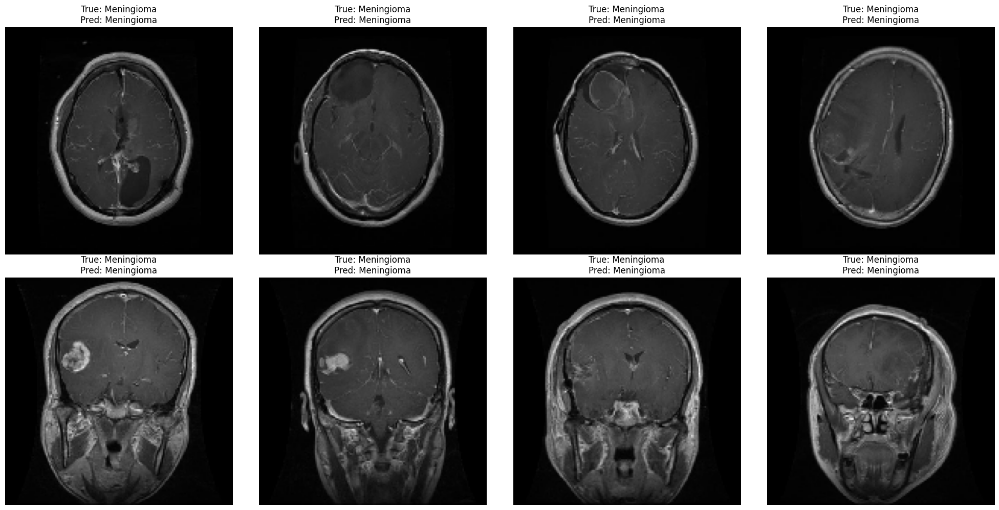

In [39]:
model_vgg19.save('vgg19_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('vgg19_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

### VGG19 Model Evaluation

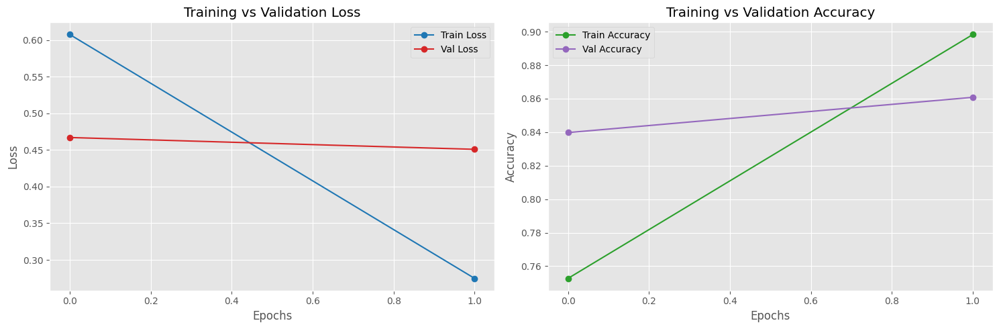

In [40]:
plot_curves(vgg19_history)

In [41]:
# Evaluate the model on the test set
loss, accuracy = model_vgg19.evaluate(test_generator)

# Display results with formatting
print(f"Test Loss     : {loss:.5f}")
print(f"Test Accuracy : {accuracy:.5f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - accuracy: 0.8272 - loss: 0.5488
Test Loss     : 0.37698
Test Accuracy : 0.88101


41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step
Classification Report for <Functional name=functional_1, built=True>:
              precision    recall  f1-score   support

  meningioma       0.96      0.83      0.89       300
   pituitary       0.93      0.69      0.79       306
      glioma       0.88      0.98      0.93       405
     notumor       0.80      0.99      0.88       300

    accuracy                           0.88      1311
   macro avg       0.89      0.87      0.87      1311
weighted avg       0.89      0.88      0.88      1311



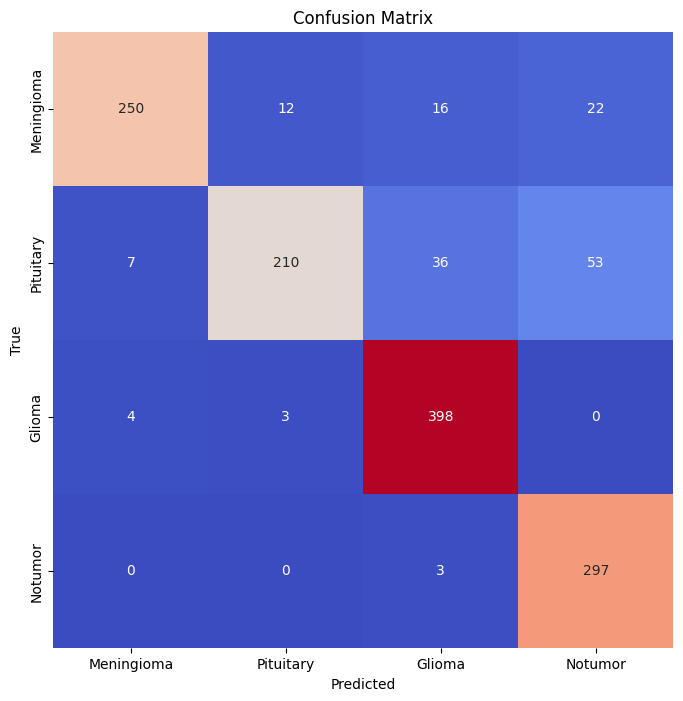

In [42]:
# Plotting confusion matrix
confusion_matrix = CM(model=model_vgg19, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()

Inception_V3

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 74, 74,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 74, 74,    │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 74, 74,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 72, 72,    │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 72, 72,    │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 35, 35,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 35, 35,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 35, 35,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 35, 35,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 33, 33,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 33, 33,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 33, 33,    │          0 │ batch_normalizat

 Total params: 22,328,356 (85.18 MB)

 Trainable params: 525,764 (2.01 MB)

 Non-trainable params: 21,802,592 (83.17 MB)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 86s 467ms/step - accuracy: 0.5487 - loss: 1.4048 - val_accuracy: 0.6713 - val_loss: 0.8647
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - accuracy: 0.7816 - loss: 0.5755 - val_accuracy: 0.7415 - val_loss: 0.6873


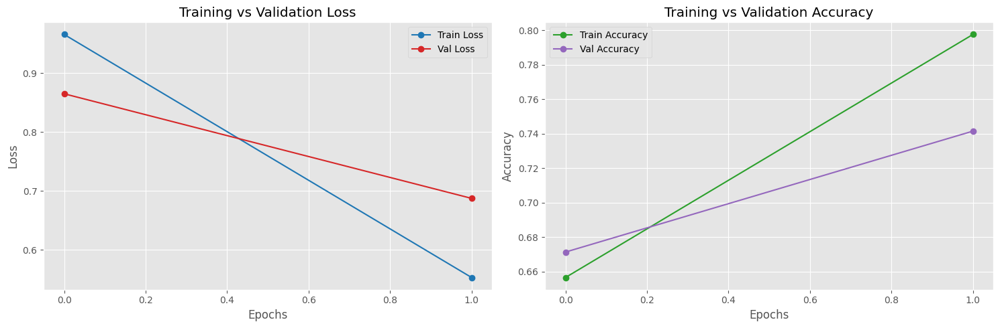

41/41 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - accuracy: 0.7254 - loss: 0.6835
 Test Loss     : 0.57281
 Test Accuracy : 0.78108
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 308ms/step
Classification Report for <Functional name=functional_2, built=True>:
              precision    recall  f1-score   support

  meningioma       0.75      0.80      0.78       300
   pituitary       0.74      0.41      0.53       306
      glioma       0.89      0.92      0.91       405
     notumor       0.71      0.95      0.81       300

    accuracy                           0.78      1311
   macro avg       0.77      0.77      0.76      1311
weighted avg       0.78      0.78      0.77      1311



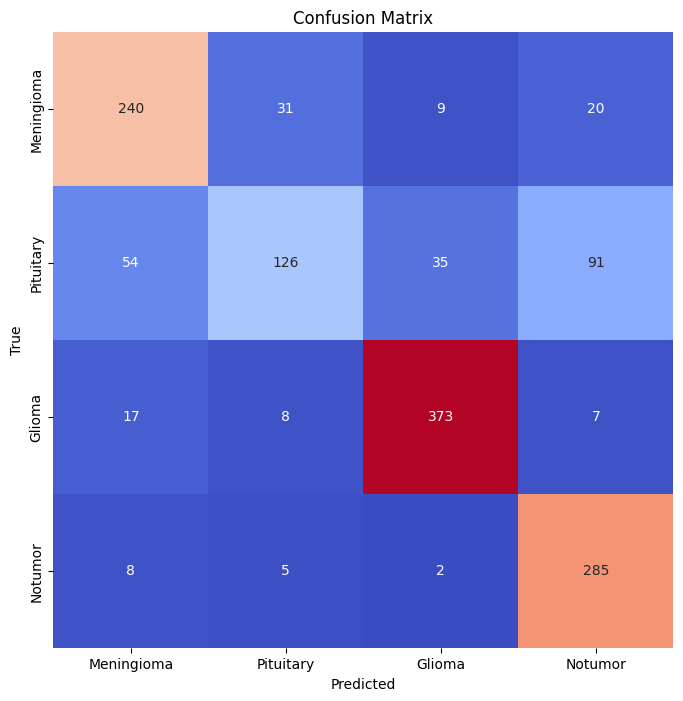

In [43]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load the InceptionV3 base model with pretrained ImageNet weights, exclude top layers
base_model_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze all layers except last 10 layers
for layer in base_model_inception.layers[:-10]:
    layer.trainable = False

for layer in base_model_inception.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model assembly
model_inception = Model(inputs=base_model_inception.input, outputs=output)

# Compile the model
model_inception.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print summary
model_inception.summary()

inception_history = model_inception.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

plot_curves(inception_history)
loss, accuracy = model_inception.evaluate(test_generator)
print(f" Test Loss     : {loss:.5f}")
print(f" Test Accuracy : {accuracy:.5f}")

# Plotting confusion matrix
confusion_matrix = CM(model=model_inception, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


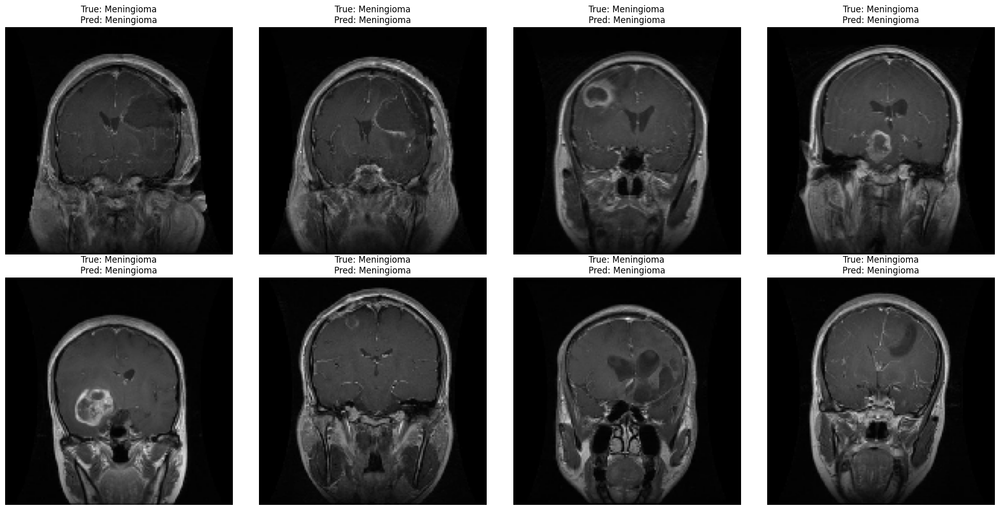

In [44]:
model_inception.save('inception_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('inception_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

Xception

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 74, 74,    │        864 │ input_layer_3[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 74, 74,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 74, 74,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 72, 72,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 72, 72,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 72, 72,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 72, 72,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 72, 72,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 72, 72,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 72, 72,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 72, 72,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_94 (Conv2D)  │ (None, 36, 36,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 36, 36,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 36, 36,    │        512 │ conv2d_94[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 36, 36,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 36, 36,    │          0 │ add[0][0]       

 Total params: 21,387,052 (81.59 MB)

 Trainable params: 6,021,892 (22.97 MB)

 Non-trainable params: 15,365,160 (58.61 MB)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 109s 550ms/step - accuracy: 0.6899 - loss: 0.7951 - val_accuracy: 0.7883 - val_loss: 0.8080
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 81s 263ms/step - accuracy: 0.9145 - loss: 0.2444 - val_accuracy: 0.8561 - val_loss: 0.3826


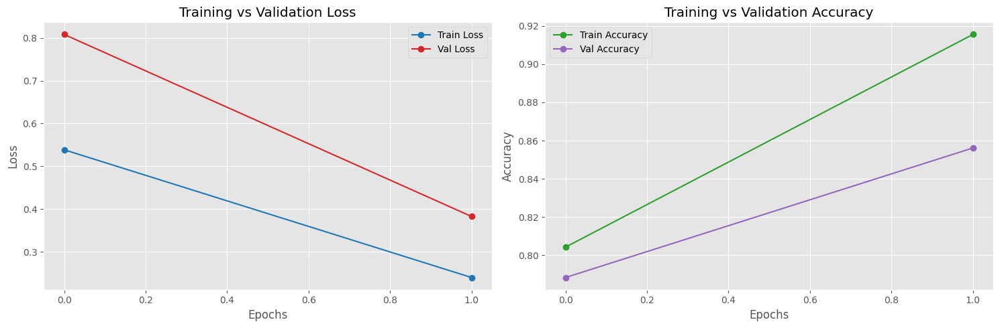

41/41 ━━━━━━━━━━━━━━━━━━━━ 15s 374ms/step - accuracy: 0.8487 - loss: 0.3603
 Test Loss     : 0.28117
 Test Accuracy : 0.88787
41/41 ━━━━━━━━━━━━━━━━━━━━ 11s 171ms/step
Classification Report for <Functional name=functional_3, built=True>:
              precision    recall  f1-score   support

  meningioma       0.90      0.82      0.86       300
   pituitary       0.79      0.78      0.79       306
      glioma       0.96      0.96      0.96       405
     notumor       0.87      0.96      0.91       300

    accuracy                           0.89      1311
   macro avg       0.88      0.88      0.88      1311
weighted avg       0.89      0.89      0.89      1311



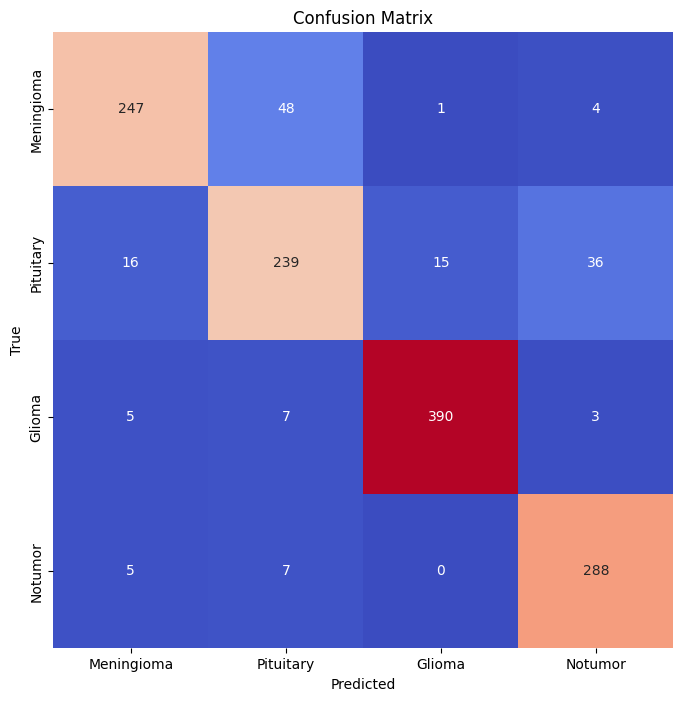

In [45]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load the Xception base model with pretrained ImageNet weights, exclude top layers
base_model_xception = Xception(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze all layers except last 10 layers
for layer in base_model_xception.layers[:-10]:
    layer.trainable = False

for layer in base_model_xception.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_xception.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model assembly
model_xception = Model(inputs=base_model_xception.input, outputs=output)

# Compile the model
model_xception.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print summary
model_xception.summary()

xception_history = model_xception.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

plot_curves(xception_history)
loss, accuracy = model_xception.evaluate(test_generator)
print(f" Test Loss     : {loss:.5f}")
print(f" Test Accuracy : {accuracy:.5f}")

# Plotting confusion matrix
confusion_matrix = CM(model=model_xception, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(len(classes)) + 0.5, labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(len(classes)) + 0.5, labels=[name.title() for name in classes], va='center')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


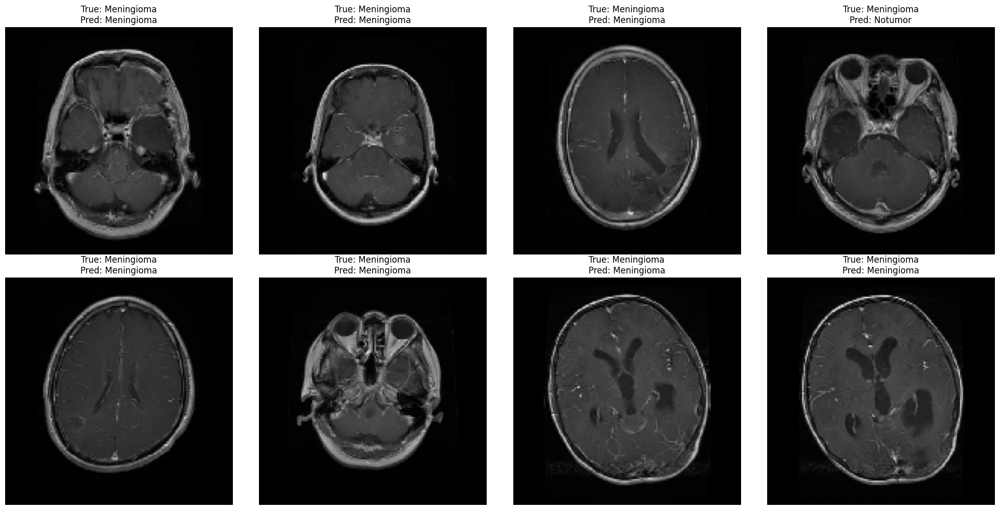

In [46]:
model_xception.save('xception_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('xception_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

## ResNet101 Model

In [47]:
base_model_resnet = ResNet101(weights='imagenet', include_top=False, input_shape=(150, 150, 3))


# for layer in base_model_resnet.layers[:-10]:
#     layer.trainable = False

# for layer in base_model_resnet.layers[-10:]:
#     layer.trainable = True


# Add custom classification head
x = base_model_resnet.output
x = GlobalAveragePooling2D()(x)

x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

model_resnet = Model(inputs=base_model_resnet.input, outputs=output)

model_resnet.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

model_resnet.summary()

171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 9s 0us/step


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 156, 156,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 75, 75,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 75, 75,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 75, 75,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 77, 77,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 38, 38,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 38, 38,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 38, 38,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 38, 38,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 38, 38,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 38, 38,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 38, 38,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 38, 38,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 38, 38,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 38, 38,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 38, 38,    │      1,024 │ conv2_block1_3_c

 Total params: 43,709,316 (166.74 MB)

 Trainable params: 43,603,972 (166.34 MB)

 Non-trainable params: 105,344 (411.50 KB)

In [48]:
resnet_history = model_resnet.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 234s 732ms/step - accuracy: 0.8016 - loss: 0.5162 - val_accuracy: 0.2456 - val_loss: 4.7847
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 54s 353ms/step - accuracy: 0.9494 - loss: 0.1376 - val_accuracy: 0.2234 - val_loss: 9.4285


1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


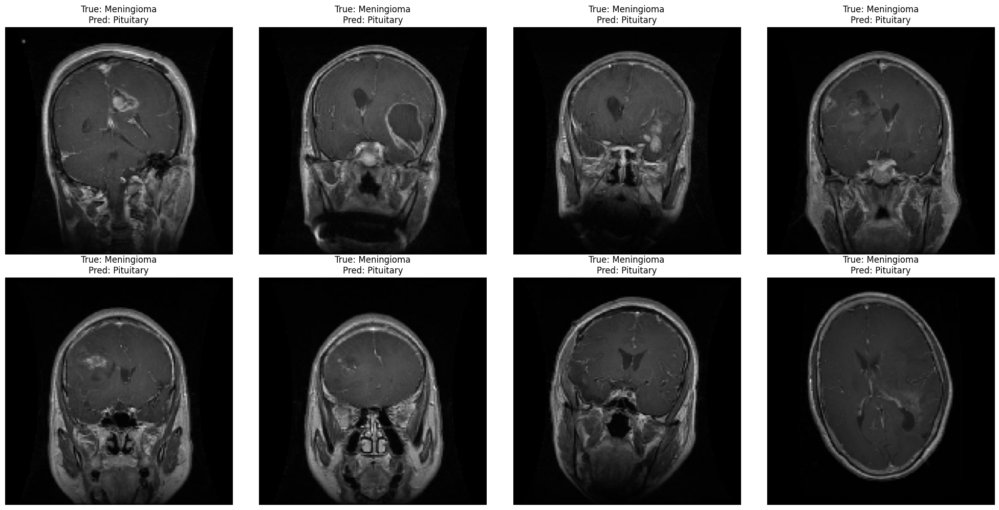

In [49]:
model_resnet.save('resnet_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('resnet_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

### ResNet101 Model Evaluation

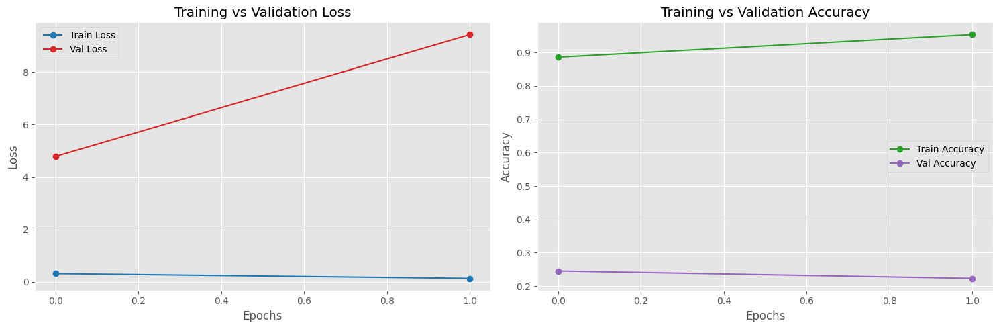

In [50]:
plot_curves(resnet_history)

In [51]:
loss, accuracy = model_resnet.evaluate(test_generator)
print(f"Test Loss: {loss:0.5f}")
print(f"Test Accuracy: {accuracy:0.5f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 8s 203ms/step - accuracy: 0.2336 - loss: 9.5852
Test Loss: 8.48700
Test Accuracy: 0.21587


41/41 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step
Classification Report for <Functional name=functional_4, built=True>:
              precision    recall  f1-score   support

  meningioma       0.02      0.01      0.01       300
   pituitary       0.24      0.91      0.37       306
      glioma       1.00      0.00      0.00       405
     notumor       0.00      0.00      0.00       300

    accuracy                           0.22      1311
   macro avg       0.31      0.23      0.10      1311
weighted avg       0.37      0.22      0.09      1311



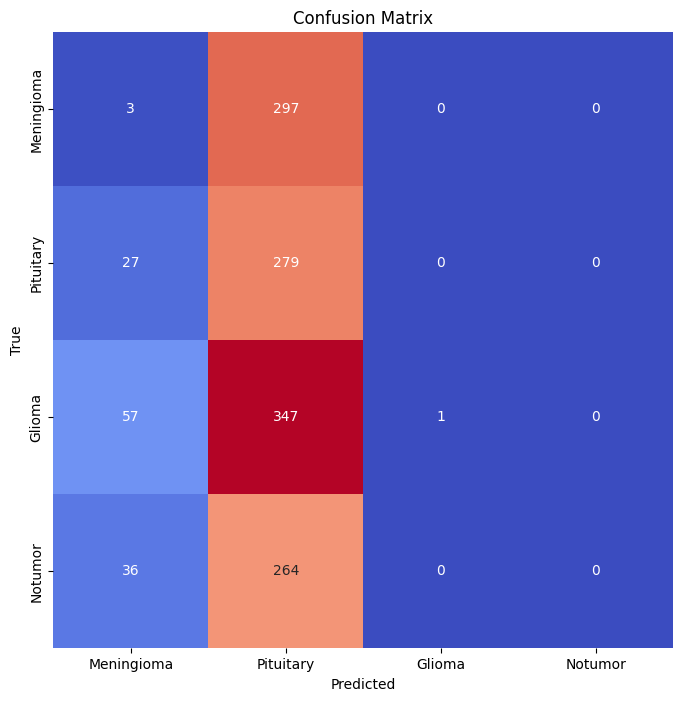

In [52]:
# Plotting confusion matrix
confusion_matrix = CM(model=model_resnet, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()

EfficientNetB0

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 150, 150,  │          0 │ input_layer_5[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 150, 150,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 150, 150,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 151, 151,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 75, 75,    │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 75, 75,    │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 75, 75,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 75, 75,    │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 75, 75,    │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 75, 75,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 75, 75,    │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 75, 75,    │        512 │ block1a_se_excit

 Total params: 4,378,535 (16.70 MB)

 Trainable params: 1,222,196 (4.66 MB)

 Non-trainable params: 3,156,339 (12.04 MB)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 117s 548ms/step - accuracy: 0.2702 - loss: 1.4198 - val_accuracy: 0.2795 - val_loss: 1.3820
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - accuracy: 0.2943 - loss: 1.3794 - val_accuracy: 0.2795 - val_loss: 1.3705


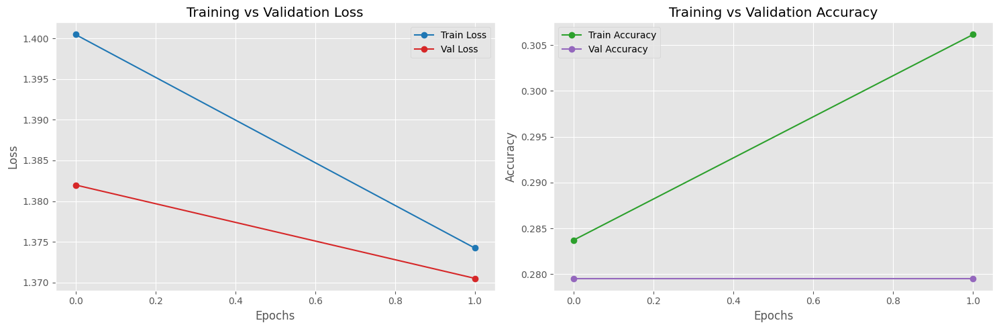

41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 305ms/step - accuracy: 0.1600 - loss: 1.4446
 Test Loss     : 1.36549
 Test Accuracy : 0.30892
41/41 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step
Classification Report for <Functional name=functional_5, built=True>:
              precision    recall  f1-score   support

  meningioma       0.00      0.00      0.00       300
   pituitary       0.00      0.00      0.00       306
      glioma       0.31      1.00      0.47       405
     notumor       0.00      0.00      0.00       300

    accuracy                           0.31      1311
   macro avg       0.08      0.25      0.12      1311
weighted avg       0.10      0.31      0.15      1311



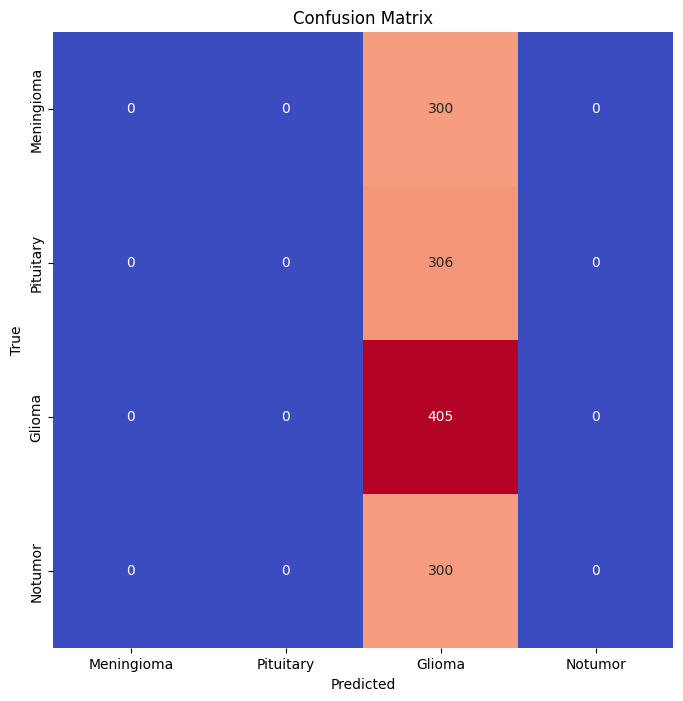

In [53]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load EfficientNetB0 base model with pretrained ImageNet weights, exclude top layers
base_model_effnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze all layers except last 10 layers
for layer in base_model_effnet.layers[:-10]:
    layer.trainable = False

for layer in base_model_effnet.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_effnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model assembly
model_effnet = Model(inputs=base_model_effnet.input, outputs=output)

# Compile the model
model_effnet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print summary
model_effnet.summary()

effnet_history = model_effnet.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

plot_curves(effnet_history)
loss, accuracy = model_effnet.evaluate(test_generator)
print(f" Test Loss     : {loss:.5f}")
print(f" Test Accuracy : {accuracy:.5f}")

# Plotting confusion matrix
confusion_matrix = CM(model=model_effnet, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(len(classes)) + 0.5, labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(len(classes)) + 0.5, labels=[name.title() for name in classes], va='center')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


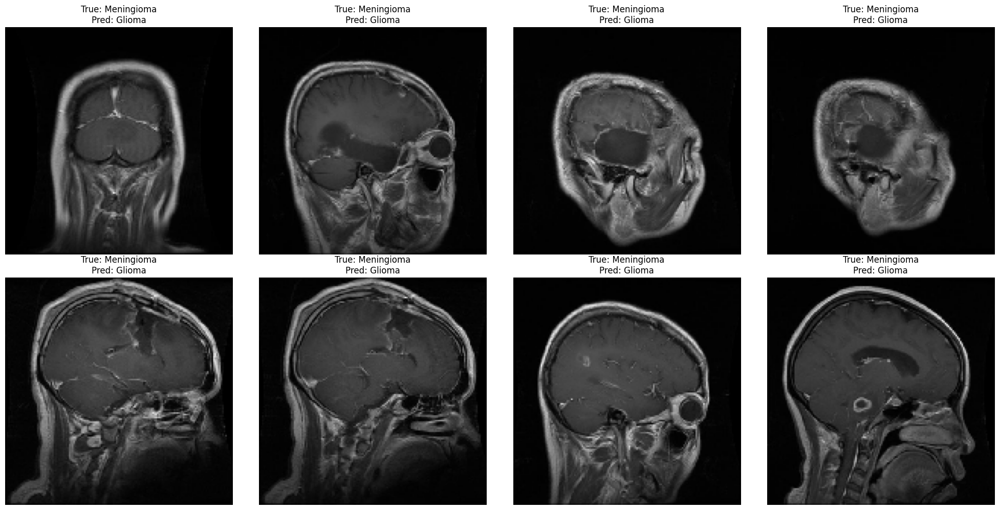

In [54]:
model_effnet.save('effnet_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('effnet_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

InceptionResNetV2

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 74, 74,    │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 74, 74,    │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 74, 74,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 72, 72,    │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 72, 72,    │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 35, 35,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 35, 35,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 35, 35,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 35, 35,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 33, 33,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 33, 33,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 33, 33,    │          0 │ batch_normalizat

 Total params: 54,731,236 (208.78 MB)

 Trainable params: 4,525,284 (17.26 MB)

 Non-trainable params: 50,205,952 (191.52 MB)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 109s 501ms/step - accuracy: 0.6906 - loss: 0.7820 - val_accuracy: 0.7497 - val_loss: 0.7075
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 42s 273ms/step - accuracy: 0.8579 - loss: 0.3802 - val_accuracy: 0.7684 - val_loss: 0.6625
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
41/41 ━━━━━━━━━━━━━━━━━━━━ 26s 275ms/step - accuracy: 0.7862 - loss: 0.5975
Test Loss     : 0.46397
Test Accuracy : 0.83753
41/41 ━━━━━━━━━━━━━━━━━━━━ 25s 351ms/step
Classification Report for <Functional name=functional, built=True>:
              precision    recall  f1-score   support

  meningioma       0.88      0.83      0.86       300
   pituitary       0.85      0.59      0.70       306
      glioma       0.95      0.92      0.94       405
     notumor       0.69      0.99      0.82       300

    accuracy                           0.84      1311
   macro avg       0.85      0.83      0.83      1311
weighted avg       0.85      0.84      0.83      1311



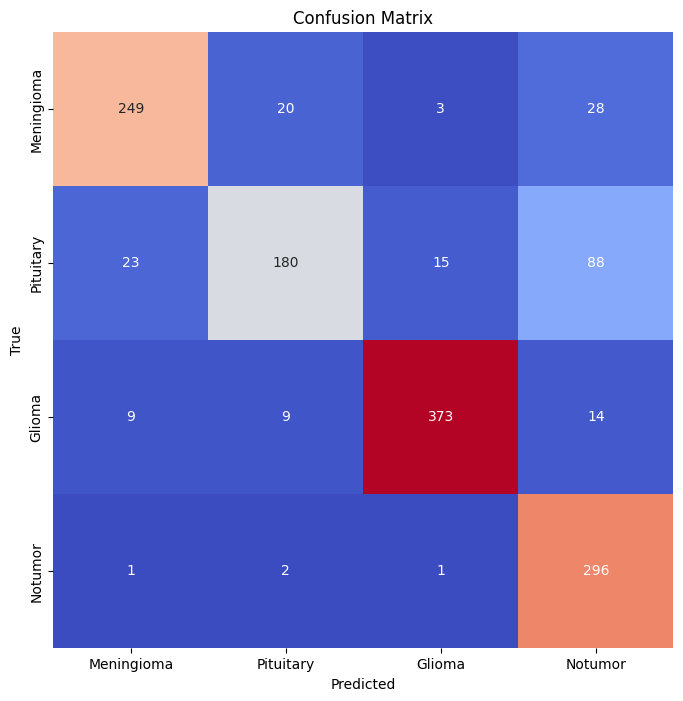

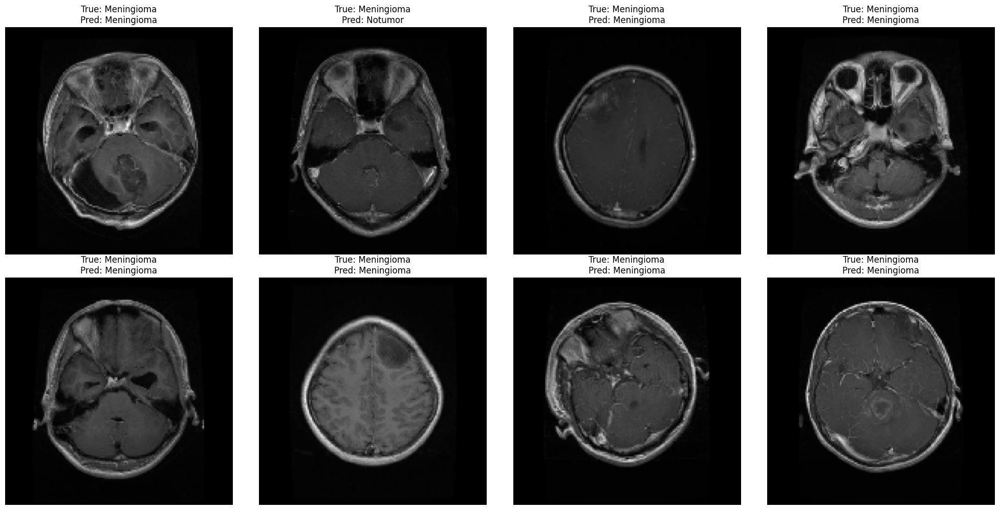

In [28]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Layer
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import custom_object_scope
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Correct CustomScaleLayer that handles list inputs properly
class CustomScaleLayer(Layer):
    def __init__(self, scale=1.0, **kwargs):
        super(CustomScaleLayer, self).__init__(**kwargs)
        self.scale = scale

    def call(self, inputs):
        # inputs is expected to be a list of tensors, scale the second tensor
        if isinstance(inputs, list) and len(inputs) == 2:
            input1, input2 = inputs
            return input1 + input2 * self.scale
        else:
            # Fallback: scale input directly if not a list
            return inputs * self.scale

    def get_config(self):
        config = super(CustomScaleLayer, self).get_config()
        config.update({'scale': self.scale})
        return config

# Parameters
num_classes = 4  # Adapt as needed
input_shape = (150, 150, 3)

# Load base model
base_model_IRV2 = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze all layers except last 10 layers
for layer in base_model_IRV2.layers[:-10]:
    layer.trainable = False
for layer in base_model_IRV2.layers[-10:]:
    layer.trainable = True

# Add global average pooling and classification head
x = base_model_IRV2.output
# No need to add CustomScaleLayer here manually, it's used internally in the base model
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

model_IRV2 = Model(inputs=base_model_IRV2.input, outputs=output)

# Compile
model_IRV2.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print summary
model_IRV2.summary()

# Assume train_generator, val_generator, test_generator, and classes list defined appropriately

# Train the model
history = model_IRV2.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

# Save the model in .keras format (recommended)
model_IRV2.save('inceptionresnetv2_brain_tumor_model.keras')

# Load model with custom layer object scope
with custom_object_scope({'CustomScaleLayer': CustomScaleLayer}):
    loaded_model = load_model('inceptionresnetv2_brain_tumor_model.keras')

# Evaluate and predict on test set
test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)

loss, accuracy = loaded_model.evaluate(test_generator)
print(f"Test Loss     : {loss:.5f}")
print(f"Test Accuracy : {accuracy:.5f}")

# Assuming you have a function CM for confusion matrix
confusion_matrix = CM(model=loaded_model, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(len(classes)) + 0.5, labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(len(classes)) + 0.5, labels=[name.title() for name in classes], va='center')
plt.show()

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        axes[i].imshow(images[i])
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

## MobileNetV2

In [29]:
# Load the MobileNetV2 base model with pretrained ImageNet weights
base_model_mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze most layers to leverage pretrained features
for layer in base_model_mobilenet.layers[:-10]:
    layer.trainable = False

for layer in base_model_mobilenet.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_mobilenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model assembly
model_mobilenet = Model(inputs=base_model_mobilenet.input, outputs=output)

# Compile the model
model_mobilenet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print summary
model_mobilenet.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 2,586,948 (9.87 MB)

 Trainable params: 1,061,444 (4.05 MB)

 Non-trainable params: 1,525,504 (5.82 MB)

In [30]:
mobilenet_history = model_mobilenet.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 100s 487ms/step - accuracy: 0.6691 - loss: 0.8066 - val_accuracy: 0.7380 - val_loss: 0.7012
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - accuracy: 0.8825 - loss: 0.3216 - val_accuracy: 0.7626 - val_loss: 0.7747


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


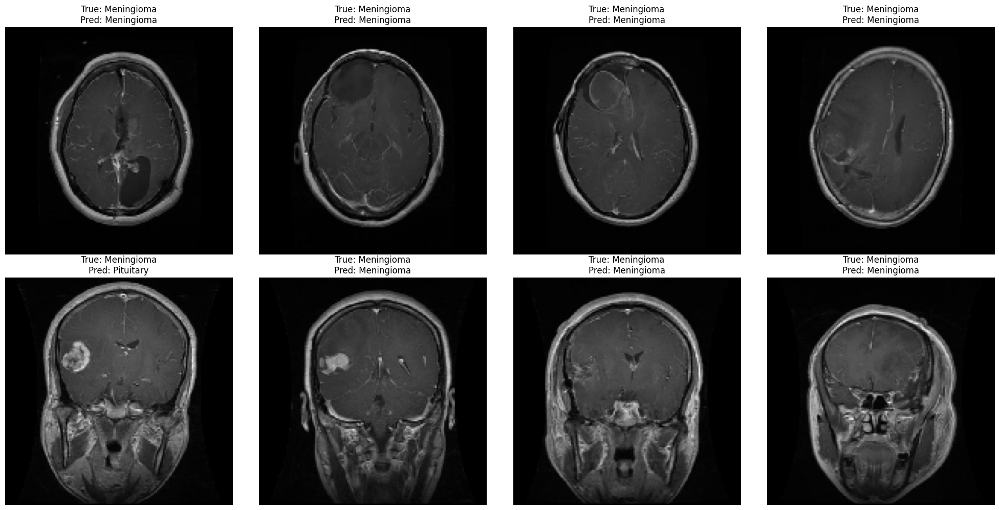

In [31]:
model_mobilenet.save('mobilenet_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('mobilenet_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

## MobileNetV2 Model Evaluation

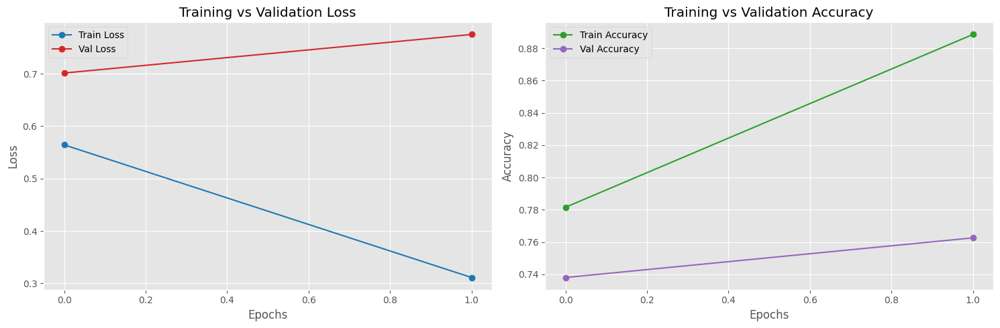

In [32]:
plot_curves(mobilenet_history)

In [33]:
loss, accuracy = model_mobilenet.evaluate(test_generator)
print(f" Test Loss     : {loss:.5f}")
print(f" Test Accuracy : {accuracy:.5f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 297ms/step - accuracy: 0.7807 - loss: 0.6466
 Test Loss     : 0.50243
 Test Accuracy : 0.83524


41/41 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step
Classification Report for <Functional name=functional_1, built=True>:
              precision    recall  f1-score   support

  meningioma       0.90      0.73      0.81       300
   pituitary       0.66      0.70      0.68       306
      glioma       0.90      0.95      0.92       405
     notumor       0.87      0.92      0.90       300

    accuracy                           0.84      1311
   macro avg       0.83      0.83      0.83      1311
weighted avg       0.84      0.84      0.83      1311



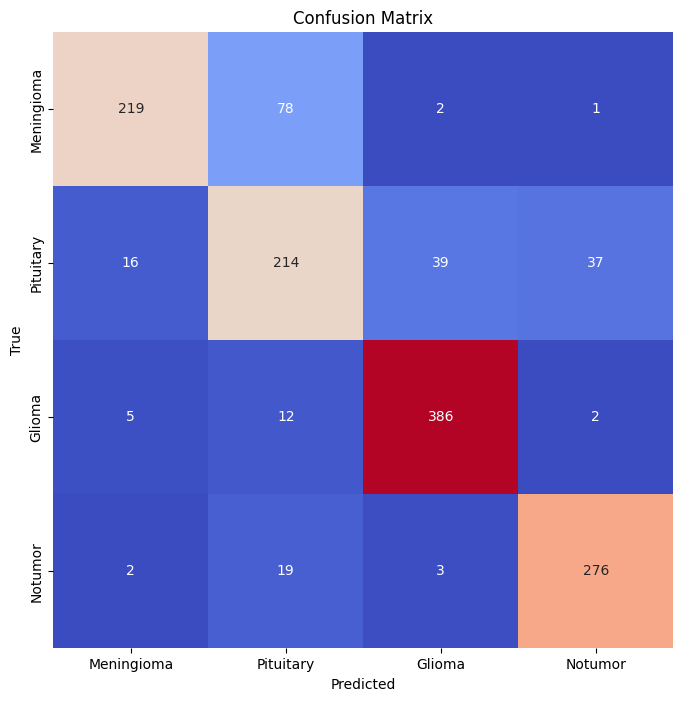

In [34]:
# Plotting confusion matrix
confusion_matrix = CM(model=model_mobilenet, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()

DenseNet121

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 156, 156,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 75, 75,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 75, 75,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 75, 75,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 77, 77,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 38, 38,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 38, 38,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 38, 38,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 38, 38,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 38, 38,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 38, 38,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 38, 38,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 38, 38,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 38, 38,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 38, 38,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 38, 38,    │     12,288 │ conv2_block2_0_r

 Total params: 7,300,932 (27.85 MB)

 Trainable params: 431,556 (1.65 MB)

 Non-trainable params: 6,869,376 (26.20 MB)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 122s 536ms/step - accuracy: 0.5362 - loss: 1.2387 - val_accuracy: 0.7415 - val_loss: 0.7789
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 39s 255ms/step - accuracy: 0.8345 - loss: 0.4635 - val_accuracy: 0.7930 - val_loss: 0.6097


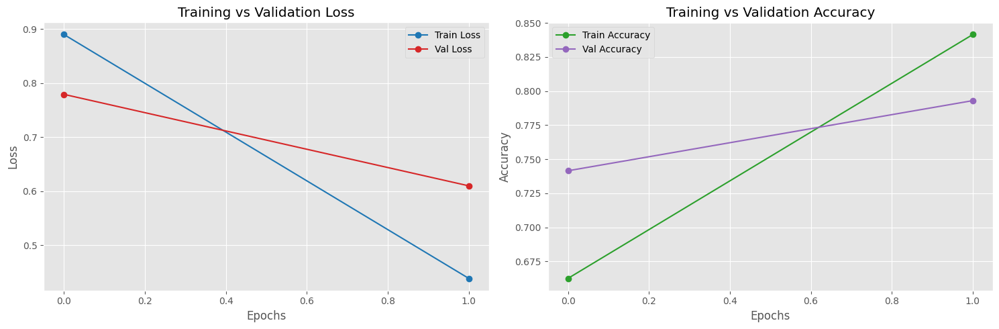

41/41 ━━━━━━━━━━━━━━━━━━━━ 15s 367ms/step - accuracy: 0.7920 - loss: 0.5282
 Test Loss     : 0.41248
 Test Accuracy : 0.85584
41/41 ━━━━━━━━━━━━━━━━━━━━ 28s 392ms/step
Classification Report for <Functional name=functional_2, built=True>:
              precision    recall  f1-score   support

  meningioma       0.91      0.79      0.84       300
   pituitary       0.77      0.68      0.72       306
      glioma       0.89      0.95      0.92       405
     notumor       0.84      0.98      0.90       300

    accuracy                           0.86      1311
   macro avg       0.85      0.85      0.85      1311
weighted avg       0.86      0.86      0.85      1311



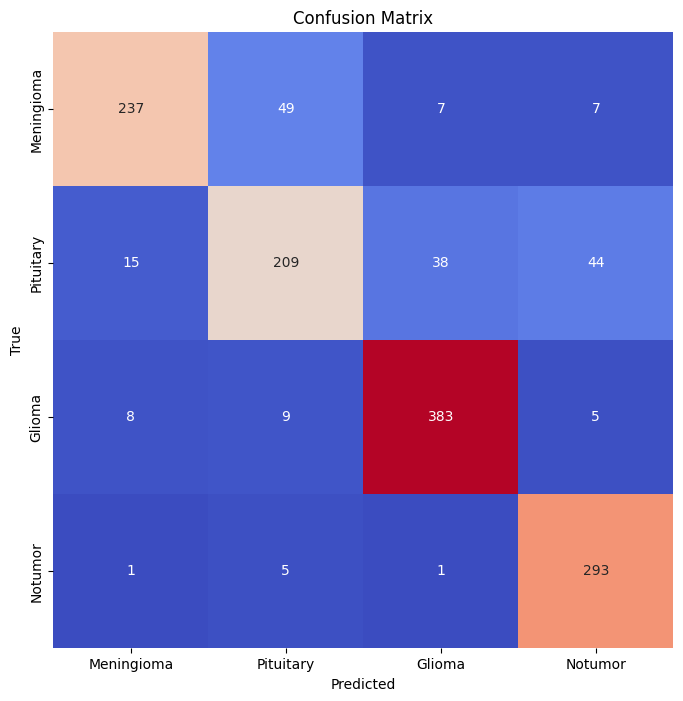

In [35]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the DenseNet121 base model with pretrained ImageNet weights, exclude top layers
base_model_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze all layers except last 10 layers
for layer in base_model_densenet.layers[:-10]:
    layer.trainable = False

for layer in base_model_densenet.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_densenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model assembly
model_densenet = Model(inputs=base_model_densenet.input, outputs=output)

# Compile the model
model_densenet.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
model_densenet.summary()

# Train the model
densenet_history = model_densenet.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

# Plot training curves
plot_curves(densenet_history)

# Evaluate the model on test data
loss, accuracy = model_densenet.evaluate(test_generator)
print(f" Test Loss     : {loss:.5f}")
print(f" Test Accuracy : {accuracy:.5f}")

# Plotting confusion matrix
confusion_matrix = CM(model=model_densenet, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(len(classes)) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(len(classes)) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


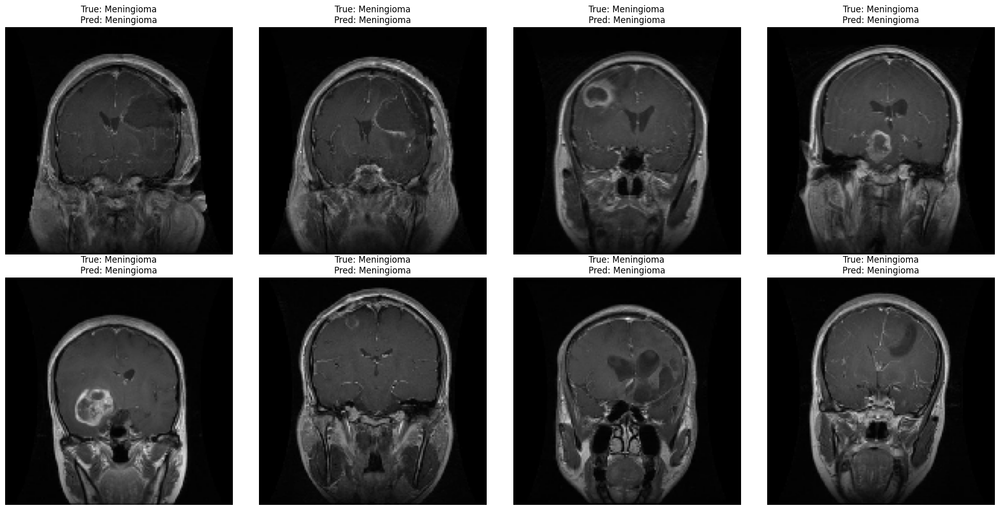

In [36]:
model_densenet.save('densenet_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('densenet_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)

MobileNet1

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "model_mobilenetv1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 75, 75, 32)     │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 75, 75, 32)     │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 75, 75, 32)     │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 75, 75, 64)     │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 76, 76, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 37, 37, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 37, 37, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 37, 37, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 37, 37, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 3,492,292 (13.32 MB)

 Trainable params: 1,851,652 (7.06 MB)

 Non-trainable params: 1,640,640 (6.26 MB)

Epoch 1/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 88s 488ms/step - accuracy: 0.6793 - loss: 0.8907 - val_accuracy: 0.7708 - val_loss: 0.6465
Epoch 2/2
152/152 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - accuracy: 0.8959 - loss: 0.2845 - val_accuracy: 0.8795 - val_loss: 0.3489


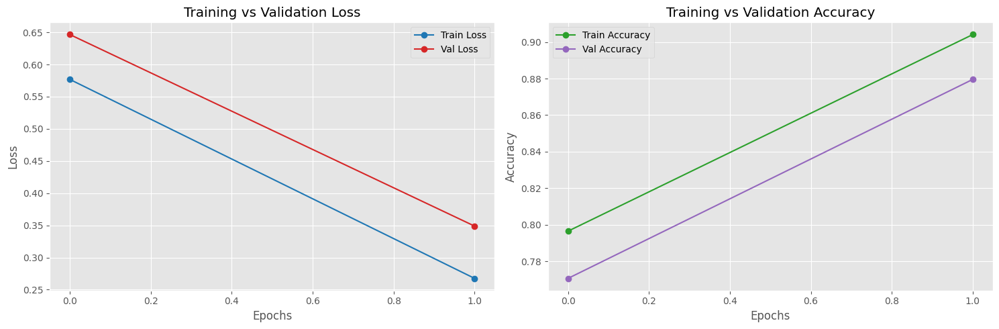

41/41 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - accuracy: 0.8862 - loss: 0.3097
Test Loss     : 0.26881
Test Accuracy : 0.90694
41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step
Classification Report for <Functional name=model_mobilenetv1, built=True>:
              precision    recall  f1-score   support

  meningioma       0.88      0.93      0.90       300
   pituitary       0.91      0.74      0.81       306
      glioma       0.95      0.96      0.96       405
     notumor       0.88      0.98      0.93       300

    accuracy                           0.91      1311
   macro avg       0.90      0.90      0.90      1311
weighted avg       0.91      0.91      0.90      1311



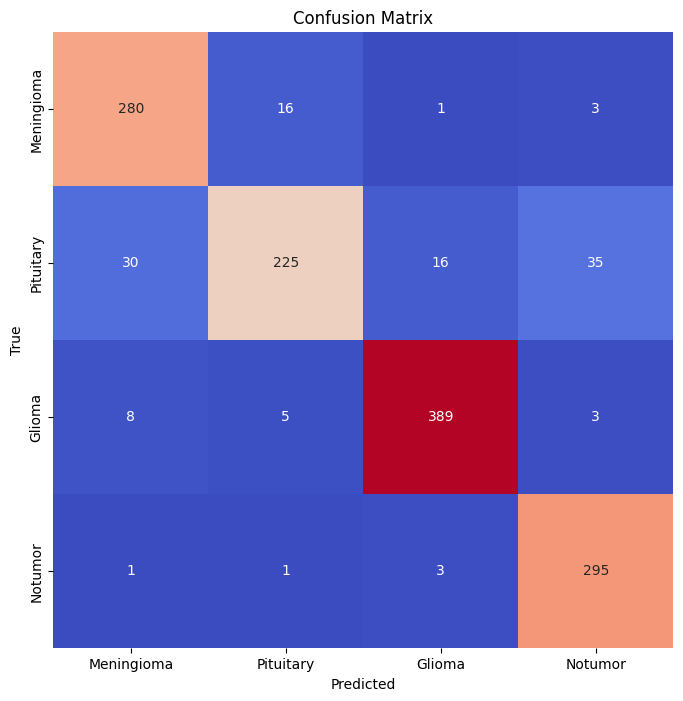

In [37]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the MobileNet base model with pretrained ImageNet weights, exclude top layers
base_model_mobilenet = MobileNet(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze all layers except last 10 layers
for layer in base_model_mobilenet.layers[:-10]:
    layer.trainable = False
for layer in base_model_mobilenet.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_mobilenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model assembly with custom name
model_mobilenetv1 = Model(inputs=base_model_mobilenet.input, outputs=output, name='model_mobilenetv1')

# Compile the model
model_mobilenetv1.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
model_mobilenetv1.summary()

# Train the model
mobilenetv1_history = model_mobilenetv1.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator
)

# Plot training curves (requires your plot_curves function)
plot_curves(mobilenetv1_history)

# Evaluate the model on test data
loss, accuracy = model_mobilenetv1.evaluate(test_generator)
print(f"Test Loss     : {loss:.5f}")
print(f"Test Accuracy : {accuracy:.5f}")

# Get confusion matrix (requires your CM function)
confusion_matrix = CM(model=model_mobilenetv1, test_generator=test_generator, categories=classes)

# Plot confusion matrix heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="coolwarm", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(len(classes)) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(len(classes)) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


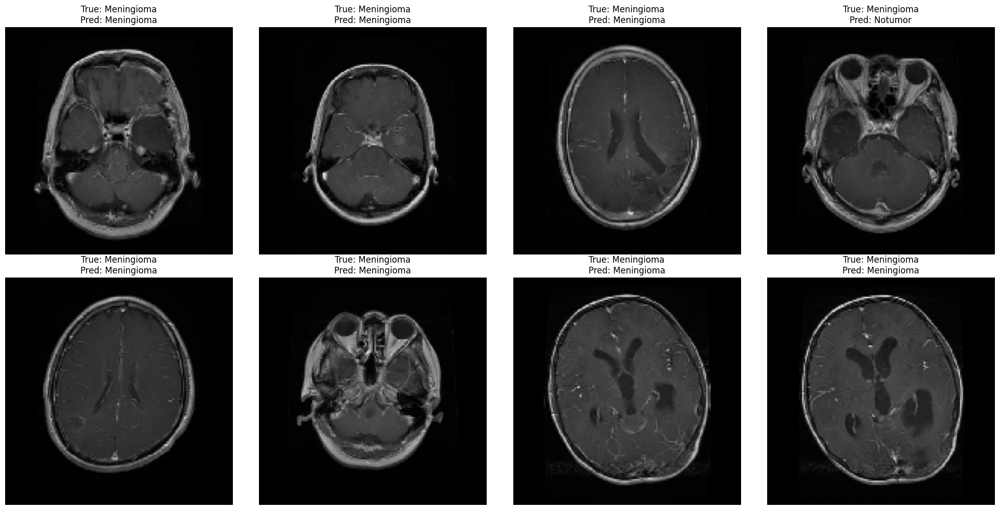

In [38]:
model_mobilenetv1.save('mobilenetv1_brain_tumor_model.h5')

from tensorflow.keras.models import load_model
# Load the saved model
loaded_model = load_model('mobilenetv1_brain_tumor_model.h5')

test_images, test_labels = next(test_generator)
predictions = loaded_model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels, axis=1)
import matplotlib.pyplot as plt
import numpy as np

def plot_loaded_model_predictions(images, true_classes, predicted_classes, classes, num_samples=8):
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = images[i]
        # If images are normalized to [0,1], no need to rescale
        axes[i].imshow(img)
        axes[i].set_title(f"True: {classes[true_classes[i]].title()}\nPred: {classes[predicted_classes[i]].title()}")
        axes[i].axis('off')

    # Hide any unused subplots
    for j in range(num_samples, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_loaded_model_predictions(test_images, true_classes, predicted_classes, classes, num_samples=8)